In [1]:
pip install folium

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install geopy

Note: you may need to restart the kernel to use updated packages.


In [3]:
import pandas as pd
import nltk
import string

# Download NLTK resources (only needed once)
nltk.download('stopwords')
nltk.download('punkt')

/home/ec2-user/anaconda3/envs/python3/lib/python3.10/site-packages/pandas/core/computation/expressions.py:21: UserWarning: Pandas requires version '2.8.0' or newer of 'numexpr' (version '2.7.3' currently installed).
  from pandas.core.computation.check import NUMEXPR_INSTALLED
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [4]:
df = pd.read_csv('course_info.tsv', sep='\t')
df = df.replace('', pd.NA)
df.dropna(axis=0, how='any', inplace=True)
df = df.dropna(subset=['fees']).reset_index(drop=True)
df.head(5)

,courseName,universityName,facultyName,isItFullTime,description,startDate,fees,modality,duration,city,country,administration,url
0,3D Design for Virtual Environments - MSc,Glasgow Caledonian University,School of Engineering and Built Environment,Full time,3D visualisation and animation play a role in ...,September,Please see the university website for further ...,MSc,1 year full-time,Glasgow,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
1,Accounting and Finance - MSc,University of Leeds,Leeds University Business School,Full time,Businesses and governments rely on sound finan...,September,"UK: £18,000 (Total)International: £34,750 (Total)",MSc,1 year full time,Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
2,"Accounting, Accountability & Financial Managem...",King’s College London,King’s Business School,Full time,"Our Accounting, Accountability & Financial Man...",September,Please see the university website for further ...,MSc,1 year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
3,"Accounting, Financial Management and Digital B...",University of Reading,Henley Business School,Full time,Embark on a professional accounting career wit...,September,Please see the university website for further ...,MSc,1 year full time,Reading,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
4,Addictions MSc,King’s College London,"Institute of Psychiatry, Psychology and Neuros...",Full time,Join us for an online session for prospective ...,September,Please see the university website for further ...,MSc,One year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...


## 2.0 Preprocessing

In [5]:
def preprocess_text(description):
    # Convert to lowercase
    description = description.lower()
    #
    ## Remove punctuation
    #for char in string.punctuation:
    #    description = description.replace(char, '')
    #
    
    # Tokenize
    tokens = nltk.word_tokenize(description)
    
    #stop_words = set(nltk.corpus.stopwords.words('english'))
    #tokens = [word for word in tokens if word not in stop_words]
    
    # Remove stopwords and punctuation
    stop_words = nltk.corpus.stopwords.words('english')
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]

    # Stemming
    stemmer = nltk.PorterStemmer()
    tokens = [stemmer.stem(word) for word in tokens]

    # Join tokens back into a string
    processed_text = ' '.join(tokens)

    return processed_text

df['cleaned_descr'] = df.description.apply(preprocess_text)
df.head(20)

,courseName,universityName,facultyName,isItFullTime,description,startDate,fees,modality,duration,city,country,administration,url,cleaned_descr
0,3D Design for Virtual Environments - MSc,Glasgow Caledonian University,School of Engineering and Built Environment,Full time,3D visualisation and animation play a role in ...,September,Please see the university website for further ...,MSc,1 year full-time,Glasgow,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,3d visualis anim play role mani area popular m...
1,Accounting and Finance - MSc,University of Leeds,Leeds University Business School,Full time,Businesses and governments rely on sound finan...,September,"UK: £18,000 (Total)International: £34,750 (Total)",MSc,1 year full time,Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,busi govern reli sound financi knowledg underp...
2,"Accounting, Accountability & Financial Managem...",King’s College London,King’s Business School,Full time,"Our Accounting, Accountability & Financial Man...",September,Please see the university website for further ...,MSc,1 year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,account account financi manag msc cours provid...
3,"Accounting, Financial Management and Digital B...",University of Reading,Henley Business School,Full time,Embark on a professional accounting career wit...,September,Please see the university website for further ...,MSc,1 year full time,Reading,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,embark profession account career academ msc pr...
4,Addictions MSc,King’s College London,"Institute of Psychiatry, Psychology and Neuros...",Full time,Join us for an online session for prospective ...,September,Please see the university website for further ...,MSc,One year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,join us onlin session prospect student find ms...
5,Advanced Chemical Engineering - MSc,University of Leeds,School of Chemical and Process Engineering,Full time,The Advanced Chemical Engineering MSc at Leeds...,September,"UK: £13,750 (Total)International: £31,000 (Total)",MSc,1 year full time,Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,advanc chemic engin msc leed build core founda...
6,Advanced Physiotherapy Practice - MSc,Glasgow Caledonian University,School of Health and Life Sciences,Full time,Progress your career as a physiotherapist with...,"January, September",Please see the university website for further ...,MSc,1 Year Full Time / 2-3 Years Part Time,Glasgow,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,progress career physiotherapist within nh priv...
7,Agricultural Sciences - MSc (Agriculture and F...,University of Helsinki,International Masters Degree Programmes,Full time,Goal of the pro­grammeWould you like to be inv...,September,Tuition fee per year (non-EU/EEA students): 15...,MSc,2 years,Helsinki,Finland,On Campus,https://www.findamasters.com/masters-degrees/c...,goal like involv find solut futur challeng foo...
8,"Agricultural, Environmental and Resource Econo...",University of Helsinki,International Masters Degree Programmes,Full time,Goal of the pro­grammeAre you looking forward ...,September,Tuition fee per year (non-EU/EEA students): 15...,MSc,2 years,Helsinki,Finland,On Campus,https://www.findamasters.com/masters-degrees/c...,goal look forward futur expert agricultur envi...
9,Air Quality Solutions - MSc,University of Leeds,Institute for Transport Studies,Full time,Up to 7 million people are estimated to die ev...,September,"UK: £12,500 (Total)International: £28,750 (Total)",MSc,"1 year full time, 2 or 3 years part-time",Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,7 million peopl estim die everi year due harm ...


In [6]:
df.fees.iloc[-200:-150]

4919                                  Full time - £18,000
4920    Home: £14,250Overseas: £26,750EU/EEA/Swiss stu...
4921    Please see the university website for further ...
4922    Please see the university website for further ...
4923    Please see the university website for further ...
4924    Please see the university website for further ...
4925    Please see the university website for further ...
4926    Please see the university website for further ...
4927         For programme fees please visit our website.
4928    Please see the university website for further ...
4929    Band 2UK fees :Please see the university websi...
4930    Please see the university website for further ...
4931    Home - Full-time - £8395 per yearHome -Part-ti...
4932    Please see the university website for further ...
4933    Please see the university website for further ...
4934    Please see the university website for further ...
4935    Please see the university website for further ...
4936    Please

In [7]:
df.fees.iloc[:20]

0     Please see the university website for further ...
1     UK: £18,000 (Total)International: £34,750 (Total)
2     Please see the university website for further ...
3     Please see the university website for further ...
4     Please see the university website for further ...
5     UK: £13,750 (Total)International: £31,000 (Total)
6     Please see the university website for further ...
7     Tuition fee per year (non-EU/EEA students): 15...
8     Tuition fee per year (non-EU/EEA students): 15...
9     UK: £12,500 (Total)International: £28,750 (Total)
10    Please see the university website for further ...
11    Please see the university website for further ...
12    Please see the university website for further ...
13    Please see the university website for further ...
14    UK: £13,750 (Total)International: £28,000 (Total)
15    Please see the university website for further ...
16    Please see the university website for further ...
17    Please see the university website for furt

### 2.0.1 Preprocessing the fees column

In [8]:
pip install forex-python

Note: you may need to restart the kernel to use updated packages.


In [9]:
import re
from forex_python.converter import CurrencyRates

df1 = pd.read_csv('course_info.tsv', sep='\t')

fdf = {'fees': [], 'currency': []}
def preprocess_fees(fees):
    if isinstance(fees, str):
        # Extract numeric values from the fees using regex
        fees = fees.replace(',', '').replace('.', '')

        fees_values = [match.group() for match in re.finditer(r'£[0-9]+', fees)]
        fees_values2 = [match.group() for match in re.finditer(r'[0-9]+\s€', fees)]
        fees_values3 = [match.group() for match in re.finditer(r'€[0-9]+', fees)]
        fees_values4 = [match.group() for match in re.finditer(r'$[0-9]+', fees)]
        fees_values5 = [match.group() for match in re.finditer(r'[0-9]+\s EUR', fees)]
        if fees_values:
            fees_values_num = [int(fees_value.split('£')[1]) for fees_value in fees_values]
            fdf['fees'].append(max(fees_values_num))
            fdf['currency'].append('£')
        elif fees_values2:
            fees_values_num = [int(fees_value.split('€')[0]) for fees_value in fees_values2]
            fdf['fees'].append(max(fees_values_num))
            fdf['currency'].append('€')
        elif fees_values3:
            fees_values_num = [int(fees_value.split('€')[1]) for fees_value in fees_values3]
            fdf['fees'].append(max(fees_values_num))
            fdf['currency'].append('€')
        elif fees_values4:
            fees_values_num = [int(fees_value.split('$')[1]) for fees_value in fees_values4]
            fdf['fees'].append(max(fees_values_num))
            fdf['currency'].append('$')
        elif fees_values5:
            fees_values_num = [int(fees_value.split('EUR')[0]) for fees_value in fees_values5]
            fdf['fees'].append(max(fees_values_num))
            fdf['currency'].append('€')
        else:
            fdf['fees'].append('')
            fdf['currency'].append('')

# Apply the function to the 'fees' column
df1['fees'].apply(preprocess_fees)
fdf = pd.DataFrame(fdf)
fdf = fdf.replace('', pd.NA)
fdf = fdf.dropna(subset=['fees', 'currency']).reset_index(drop=True)
fdf.head(20)

,fees,currency
0,34750,£
1,31000,£
2,15000,€
3,15000,€
4,28750,£
5,722,£
6,28000,£
7,10500,£
8,15000,€
9,2500,€


In [10]:
df1

,courseName,universityName,facultyName,isItFullTime,description,startDate,fees,modality,duration,city,country,administration,url
0,3D Design for Virtual Environments - MSc,Glasgow Caledonian University,School of Engineering and Built Environment,Full time,3D visualisation and animation play a role in ...,September,Please see the university website for further ...,MSc,1 year full-time,Glasgow,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
1,Accounting and Finance - MSc,University of Leeds,Leeds University Business School,Full time,Businesses and governments rely on sound finan...,September,"UK: £18,000 (Total)International: £34,750 (Total)",MSc,1 year full time,Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
2,"Accounting, Accountability & Financial Managem...",King’s College London,King’s Business School,Full time,"Our Accounting, Accountability & Financial Man...",September,Please see the university website for further ...,MSc,1 year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
3,"Accounting, Financial Management and Digital B...",University of Reading,Henley Business School,Full time,Embark on a professional accounting career wit...,September,Please see the university website for further ...,MSc,1 year full time,Reading,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
4,Addictions MSc,King’s College London,"Institute of Psychiatry, Psychology and Neuros...",Full time,Join us for an online session for prospective ...,September,Please see the university website for further ...,MSc,One year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5970,Biology MSc,Wageningen University & Research,Life Sciences,Full time,The master's Biology is a two-year MSc program...,See Course,Please see the university website for further ...,MSc,2 years,Wageningen,Netherlands,On Campus,https://www.findamasters.com/masters-degrees/c...
5971,Biomaterials and Tissue Engineering MSc,University College London,Department of Mechanical Engineering,Full time,Register your interest in graduate study at UC...,September,"Full time - £18,000",MSc,"1 year full time, 5 years flexible",London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
5972,"Biomedical & Molecular Sciences Research MSc, ...",King’s College London,Faculty of Life Sciences & Medicine,Full time,The Biomedical & Molecular Sciences Research M...,September,Please see the university website for further ...,"MSc,MRes",MSc: one year FT; MRes 16 months FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...
5973,Biomedical and Analytical Science MSc,University of Huddersfield,School of Applied Sciences,Full time,The Biomedical and Analytical Science MSc cour...,September,Band 2UK fees:Please see the university websit...,MSc,1 year full-time,Huddersfield,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...


In [11]:
import requests
from bs4 import BeautifulSoup

url = 'https://www.ecb.europa.eu/stats/policy_and_exchange_rates/euro_reference_exchange_rates/html/index.en.html'
response = requests.get(url)

if response.status_code == 200:
    soup = BeautifulSoup(response.text, 'html.parser')

    # Assuming the exchange rates are within a div with class "currency-dashboard__dfWrapper-sc-1lclbd-3"
    exchange_rate_eur_usd = soup.find_all('span', class_='rate')[0].text
    print(exchange_rate_eur_usd)
    
    exchange_rate_eur_gbp = soup.find_all('span', class_='rate')[5].text
    print(exchange_rate_eur_gbp)
    
exchange_rate_gbp_usd = float(exchange_rate_eur_usd) / float(exchange_rate_eur_gbp)
print(exchange_rate_gbp_usd)

1.0916
0.86818
1.2573429473150728


In [12]:
exchange_rates = {'$': 1, '€': float(exchange_rate_eur_usd), '£':exchange_rate_gbp_usd}

# Function to convert fees to dollars using pre-fetched exchange rates
def convert_to_dollars(df):
    if df['currency']:
        return df['fees'] * exchange_rates.get(df['currency'], 1)
    else:
        return None

# Apply the conversion function to create a new column 'fees_in_dollars'
fdf['fees_in_dollars'] = fdf.apply(convert_to_dollars, axis=1)
fdf.head(20)

,fees,currency,fees_in_dollars
0,34750,£,43692.667419
1,31000,£,38977.631367
2,15000,€,16374.000000
3,15000,€,16374.000000
4,28750,£,36148.609735
5,722,£,907.801608
6,28000,£,35205.602525
7,10500,£,13202.100947
8,15000,€,16374.000000
9,2500,€,2729.000000


In [13]:
df['fees_$'] = fdf['fees_in_dollars']
df = df.drop(['fees'], axis=1)
df.head(20)

,courseName,universityName,facultyName,isItFullTime,description,startDate,modality,duration,city,country,administration,url,cleaned_descr,fees_$
0,3D Design for Virtual Environments - MSc,Glasgow Caledonian University,School of Engineering and Built Environment,Full time,3D visualisation and animation play a role in ...,September,MSc,1 year full-time,Glasgow,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,3d visualis anim play role mani area popular m...,43692.667419
1,Accounting and Finance - MSc,University of Leeds,Leeds University Business School,Full time,Businesses and governments rely on sound finan...,September,MSc,1 year full time,Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,busi govern reli sound financi knowledg underp...,38977.631367
2,"Accounting, Accountability & Financial Managem...",King’s College London,King’s Business School,Full time,"Our Accounting, Accountability & Financial Man...",September,MSc,1 year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,account account financi manag msc cours provid...,16374.000000
3,"Accounting, Financial Management and Digital B...",University of Reading,Henley Business School,Full time,Embark on a professional accounting career wit...,September,MSc,1 year full time,Reading,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,embark profession account career academ msc pr...,16374.000000
4,Addictions MSc,King’s College London,"Institute of Psychiatry, Psychology and Neuros...",Full time,Join us for an online session for prospective ...,September,MSc,One year FT,London,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,join us onlin session prospect student find ms...,36148.609735
5,Advanced Chemical Engineering - MSc,University of Leeds,School of Chemical and Process Engineering,Full time,The Advanced Chemical Engineering MSc at Leeds...,September,MSc,1 year full time,Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,advanc chemic engin msc leed build core founda...,907.801608
6,Advanced Physiotherapy Practice - MSc,Glasgow Caledonian University,School of Health and Life Sciences,Full time,Progress your career as a physiotherapist with...,"January, September",MSc,1 Year Full Time / 2-3 Years Part Time,Glasgow,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,progress career physiotherapist within nh priv...,35205.602525
7,Agricultural Sciences - MSc (Agriculture and F...,University of Helsinki,International Masters Degree Programmes,Full time,Goal of the pro­grammeWould you like to be inv...,September,MSc,2 years,Helsinki,Finland,On Campus,https://www.findamasters.com/masters-degrees/c...,goal like involv find solut futur challeng foo...,13202.100947
8,"Agricultural, Environmental and Resource Econo...",University of Helsinki,International Masters Degree Programmes,Full time,Goal of the pro­grammeAre you looking forward ...,September,MSc,2 years,Helsinki,Finland,On Campus,https://www.findamasters.com/masters-degrees/c...,goal look forward futur expert agricultur envi...,16374.000000
9,Air Quality Solutions - MSc,University of Leeds,Institute for Transport Studies,Full time,Up to 7 million people are estimated to die ev...,September,MSc,"1 year full time, 2 or 3 years part-time",Leeds,United Kingdom,On Campus,https://www.findamasters.com/masters-degrees/c...,7 million peopl estim die everi year due harm ...,2729.000000


## Create index

In [14]:
print(df.columns)


Index(['courseName', 'universityName', 'facultyName', 'isItFullTime',
       'description', 'startDate', 'modality', 'duration', 'city', 'country',
       'administration', 'url', 'cleaned_descr', 'fees_$'],
      dtype='object')


In [15]:
def create_vocabulary(tokens):
    voc = {}
    i = 0
    for token in tokens:
        for t in token:
            if t not in voc:
                voc[t] = i
                i += 1
    return voc

tk = [df['cleaned_descr'][i].split() for i in range(len(df['cleaned_descr']))]
vocabulary = create_vocabulary(tk)

In [16]:
vocabulary

{'3d': 0,
 'visualis': 1,
 'anim': 2,
 'play': 3,
 'role': 4,
 'mani': 5,
 'area': 6,
 'popular': 7,
 'media': 8,
 'keep': 9,
 'grow': 10,
 'digit': 11,
 'provid': 12,
 'special': 13,
 'effect': 14,
 '21st': 15,
 'centuri': 16,
 'favourit': 17,
 'film': 18,
 'televis': 19,
 'show': 20,
 'design': 21,
 'also': 22,
 'essenti': 23,
 'everyday': 24,
 'work': 25,
 'everyth': 26,
 'comput': 27,
 'game': 28,
 'develop': 29,
 'onlin': 30,
 'virtual': 31,
 'world': 32,
 'industri': 33,
 'market': 34,
 'product': 35,
 'programm': 36,
 'environ': 37,
 'help': 38,
 'skill': 39,
 'thrive': 40,
 'success': 41,
 'career': 42,
 'visual': 43,
 'practic': 44,
 'orient': 45,
 'toward': 46,
 'current': 47,
 'need': 48,
 'technolog': 49,
 'prior': 50,
 'knowledg': 51,
 'requir': 52,
 'busi': 53,
 'govern': 54,
 'reli': 55,
 'sound': 56,
 'financi': 57,
 'underpin': 58,
 'strategi': 59,
 'cours': 60,
 'profession': 61,
 'advanc': 62,
 'modern': 63,
 'theori': 64,
 'account': 65,
 'control': 66,
 'well': 67,

In [17]:
import pickle
with open('vocabulary.pkl', 'wb') as f:
    pickle.dump(vocabulary, f)
    
#with open('vocabulary.pkl', 'rb') as f:
#    d = pickle.load(f)
#    
#print(d)

In [18]:
vocabulary.values()

dict_values([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 21

In [19]:
tk

[['3d',
  'visualis',
  'anim',
  'play',
  'role',
  'mani',
  'area',
  'popular',
  'media',
  'keep',
  'grow',
  'digit',
  'anim',
  'provid',
  'special',
  'effect',
  '21st',
  'centuri',
  'favourit',
  'film',
  'televis',
  'show',
  '3d',
  'design',
  'also',
  'essenti',
  'everyday',
  'work',
  'everyth',
  'comput',
  'game',
  'develop',
  'onlin',
  'virtual',
  'world',
  'develop',
  'industri',
  'design',
  'market',
  'product',
  'design',
  'programm',
  '3d',
  'design',
  'virtual',
  'environ',
  'help',
  'develop',
  'skill',
  'thrive',
  'success',
  'career',
  'visual',
  'design',
  'programm',
  'practic',
  'orient',
  'toward',
  'current',
  'industri',
  'need',
  'technolog',
  'practic',
  'prior',
  'knowledg',
  '3d',
  'design',
  'requir'],
 ['busi',
  'govern',
  'reli',
  'sound',
  'financi',
  'knowledg',
  'underpin',
  'strategi',
  'cours',
  'profession',
  'career',
  'provid',
  'advanc',
  'knowledg',
  'modern',
  'financi',
 

In [20]:
def create_inverted_indx(vocabulary, tokens):
    inverted_index = {term_id: set() for term_id in vocabulary.values()}
    
    for i, l in enumerate(tokens):
        for token in l:
            term_id = vocabulary.get(token)
            if term_id is not None:
                inverted_index[term_id].add(i)
                
    return inverted_index
    
inverted_indx = create_inverted_indx(vocabulary, tk)

In [21]:
inverted_indx


{0: {0,
  353,
  940,
  1286,
  1288,
  1289,
  2340,
  2419,
  2712,
  3377,
  3439,
  4139,
  4140,
  4538},
 1: {0,
  194,
  209,
  241,
  242,
  613,
  772,
  880,
  1075,
  1093,
  1095,
  1097,
  1101,
  1102,
  1117,
  1121,
  1156,
  1158,
  1169,
  1172,
  2216,
  2314,
  2380,
  2382,
  2405,
  2592,
  3493,
  3806,
  3866,
  3935,
  4395,
  4723,
  4908,
  4923,
  5056,
  5057,
  5060},
 2: {0,
  7,
  107,
  125,
  126,
  159,
  655,
  687,
  941,
  1394,
  1429,
  1442,
  1455,
  1456,
  1954,
  1982,
  1985,
  2012,
  2257,
  2264,
  2319,
  2340,
  2698,
  2701,
  2731,
  2793,
  2901,
  2949,
  3858,
  4100,
  4163,
  4187,
  4225,
  4289,
  4620,
  4671,
  4672,
  4673,
  4674,
  4675,
  4676,
  4677,
  4678,
  4679,
  4680,
  4681,
  4682,
  4683,
  4703,
  4754,
  4827,
  4848,
  4852,
  4853,
  4864,
  4871,
  5038,
  5067,
  5078,
  5114},
 3: {0,
  13,
  90,
  103,
  107,
  135,
  141,
  240,
  290,
  312,
  316,
  322,
  341,
  348,
  386,
  439,
  451,
  462,
  6

## 2.1 Conjunctive query

In [22]:
def get_tokens(description):
    # Convert to lowercase
    description = description.lower()
    
    # Tokenize
    tokens = nltk.word_tokenize(description)

    # Exclude the stopwords and punctuation
    stop_words = nltk.corpus.stopwords.words('english')
    tokens = [word for word in tokens if word.isalnum() and word not in stop_words]
    

    # Stem the remaining words
    stemmer = nltk.PorterStemmer()
    tokens = set(stemmer.stem(word) for word in tokens)
    
    return tokens


def execute_query(query, vocabulary, inverted_index):
    # Tokenize query
    tokens = get_tokens(query)
    # Get term IDs
    query_terms = [vocabulary.get(token) for token in tokens]
    
    # If a term is not in the vocabulary, it means no document will contain it, thus return empty set
    if None in query_terms:
        print('One of the query terms is not in the vocabulary')
        return set()
    
    if query_terms:
        # Get documents containing the query terms
        documents = [inverted_index[term] for term in query_terms]
        # Return the intersection of the documents
        return set.intersection(*documents)
    else:
        return set()

# Execute query and get the indexes of the documents
indexes = execute_query('data pizza', vocabulary, inverted_indx)
query_res = df.loc[list(indexes), ['courseName', 'universityName', 'description', 'url']]
query_res.head()

One of the query terms is not in the vocabulary


,courseName,universityName,description,url


## 2.2 Conjuctive query and ranking score

### Build inverted tfidf index

In [23]:
import math

def inverted_index_tfidf(vocabulary, inverted_indx, tokens):
    inverted_index1 = {term_id: set() for term_id in vocabulary.values()}
    
    for i, l in enumerate(tokens):
        for token in l:
            term_id = vocabulary.get(token)
            if term_id is not None:
                tf = l.count(token)/len(l)
                idf = math.log(len(tokens)/len(inverted_indx[term_id]) + 1)
                inverted_index1[term_id].add((i, tf*idf))
    return inverted_index1

inverted_index_2 = inverted_index_tfidf(vocabulary, inverted_indx, tk)
inverted_index_2

{0: {(0, 0.3473169548791203),
  (353, 0.10543550415973293),
  (940, 0.1256252815520222),
  (1286, 0.10358575847272007),
  (1288, 0.08946042777189461),
  (1289, 0.08812519750664245),
  (2340, 0.09225606613976632),
  (2419, 0.18451213227953264),
  (2712, 0.10179979711974214),
  (3377, 0.16401078424847346),
  (3439, 0.17892085554378923),
  (4139, 0.09840647054908408),
  (4140, 0.11140355156500084),
  (4538, 0.27676819841929895)},
 1: {(0, 0.07260291840315962),
  (194, 0.08512066295542851),
  (209, 0.10732605329162725),
  (241, 0.09142589724842322),
  (242, 0.13343239057877984),
  (613, 0.10732605329162725),
  (772, 0.0881606866324081),
  (880, 0.0822833075235809),
  (1075, 0.07836505478436276),
  (1093, 0.09315091417763875),
  (1095, 0.12992101187933824),
  (1097, 0.07052854930592649),
  (1101, 0.08093440084286646),
  (1102, 0.08661400791955884),
  (1117, 0.19360778240842563),
  (1121, 0.12823372601077543),
  (1156, 0.12041459637597206),
  (1158, 0.09494227791182412),
  (1169, 0.117547582

In [24]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(lowercase=False)
results = tfidf.fit_transform(df.cleaned_descr)
result_dense = results.todense()
tfidf_data = pd.DataFrame(result_dense.tolist(), index=df.index, columns=tfidf.get_feature_names_out())
tfidf_data

,10,100,1000,104kmedian,11,11th,12,120,125kmedian,12th,...,zoonos,zoonosi,zoonot,zu,zudem,zum,zur,zurich,zwingen,école
0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.126104,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5114,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5115,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5116,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5117,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Execute the query

In [25]:
#import heapq
#from sklearn.metrics.pairwise import cosine_similarity
#
#def execute_query2(query, tfidf_data, dataframe, inverted_indx, k=5):
#    
#    # Leverage previous function to get the indexes of the documents
#    indexes = execute_query(query, vocabulary, inverted_indx)
#    # Keep the relevant documents and columns
#    query_res1 = dataframe.loc[list(indexes), ['courseName', 'universityName', 'description', 'url']]
#    # Keep the relevant tfidf data
#    relevant_docs = tfidf_data.iloc[list(indexes)]
#    
#    # Transform the query to tokens and then to tfidf
#    query = tfidf.transform(get_tokens(query))
#    # Calculate the cosine similarity between the query and the relevant documents
#    cos_sim = cosine_similarity(query, relevant_docs)[0]
#    # Get the top k indexes
#    top_k_indices = heapq.nlargest(5, range(len(cos_sim)), cos_sim.take)
#    
#    return query_res1.iloc[top_k_indices], cos_sim[top_k_indices]
#
#query_res2, similarity = execute_query2('data eneterpreneur rotterdam', tfidf_data, df, inverted_indx, k=5)
#query_res2['Similarity'] = similarity
#query_res2

In [26]:
import heapq
from sklearn.metrics.pairwise import cosine_similarity

def execute_query2(query, tfidf_data, dataframe, inverted_indx, k=5):
    # Leverage previous function to get the indexes of the documents
    indexes = execute_query(query, vocabulary, inverted_indx)
    
    # Keep the relevant documents and columns
    query_res1 = dataframe.loc[list(indexes), ['courseName', 'universityName', 'description', 'url']]
    # Keep the relevant tfidf data
    relevant_docs = tfidf_data.iloc[list(indexes)]
    
    # Convert the query to tf-idf representation after tokenization
    query_tfidf = tfidf.transform(get_tokens(query))

    try:
        # Calculate cosine similarity between the query and relevant documents
        cos_sim = cosine_similarity(query_tfidf, relevant_docs)[0]

        # Create a heap to maintain the top-k documents based on similarity
        heap = []

        for doc_index, similarity_score in enumerate(cos_sim):
            heapq.heappush(heap, (similarity_score, doc_index))
            if len(heap) > k:
                heapq.heappop(heap)

        # Get the top-k documents from the heap
        top_k = heapq.nlargest(k, heap)

        # Retrieve the corresponding dfs and scores from the heap
        result_dfs = [query_res1.iloc[doc_index] for _, doc_index in top_k]
        similarity_scores = [similarity_score for similarity_score, _ in top_k]

        return result_dfs, similarity_scores
    
    except ValueError:
        # If the query is not relevant to any document, return empty lists
        print('No relevant documents found. Check your query.')
        return [], []

# Example usage
query_res2, similarity = execute_query2('data money', tfidf_data, df, inverted_indx, k=5)
# Convert the list of dictionaries to a DataFrame
query_res2_df = pd.DataFrame(query_res2)
query_res2_df['Similarity'] = similarity
query_res2_df


,courseName,universityName,description,url,Similarity
4167,Master of Science in Supply Chain Analytics,Atlantic Technological University,Supply chain analytics is used to identify cur...,https://www.findamasters.com/masters-degrees/c...,0.113125
4122,Master of Science in Finance (FinTech and Fina...,Hong Kong Baptist University,With the rise of disruptive technologies and t...,https://www.findamasters.com/masters-degrees/c...,0.108260
3137,International Finance and Banking MSc,University of Portsmouth,OverviewStart or advance your financial career...,https://www.findamasters.com/masters-degrees/c...,0.097934
2201,Financial Technology (FinTech) MSc,University of Stirling,Fintech provides the latest information in com...,https://www.findamasters.com/masters-degrees/c...,0.086855
1331,Digital Marketing - MSc,"University of the West of England, Bristol",The digital marketing sector is booming. More ...,https://www.findamasters.com/masters-degrees/c...,0.080765


In [27]:
len(df)

5119

# 3. Define a new score!

In [29]:
# Function to calculate a new relevance score based on query terms
def new_score(row, query_tokens):
    score = 0
    # Score based on the length of cleaned description
    score += len(row['cleaned_descr'].split())
    
    # Keywords associated with MSc degrees
    msc_keywords = ['master', 'msc', 'graduate', 'postgraduate']
    
    # Increment score if MSc keywords are present in the query
    for keyword in msc_keywords:
        if keyword in query_tokens:
            score += row['cleaned_descr'].lower().count(keyword)

    # Normalize the score to a scale between 0 and 1
    score_normalized = score / 100
    
    return score_normalized

# Function to execute a query and return relevant documents with new scores
def execute_query_newscore(query, dataframe, inverted_index, k=5, cols=None):
    indexes = execute_query(query, vocabulary, inverted_index)
    
    # Default columns if not provided
    if cols is None:
        cols = ['courseName', 'universityName', 'cleaned_descr', 'url', 'fees_$', 'city', 'country']

    query_res1 = dataframe.loc[list(indexes), cols]
    relevant_docs = tfidf_data.iloc[list(indexes)]
    query_tokens = get_tokens(query)
    
    # Calculate and add new similarity scores to the DataFrame
    query_res1['New_Similarity'] = query_res1.apply(lambda dataframe: new_score(dataframe, query_tokens), axis=1)

    heap = []

    for _, r in query_res1.iterrows():
        row_values = [r[col] for col in cols + ['New_Similarity']]
        heapq.heappush(heap, tuple(row_values))

        if len(heap) > k:
            heapq.heappop(heap)

    top_k = heapq.nlargest(k, heap)
    cols = cols + ['New_Similarity']
    query_res_newscore_df = pd.DataFrame(top_k, columns=cols)
    return query_res_newscore_df


# Example usage
query_res_newscore = execute_query_newscore('data money', df, inverted_indx, k=5)
query_res_newscore
dataF = df

These Python features beautify document retrieval by way of incorporating a brand new relevance rating primarily based on question phrases. The `new_score` function calculates the rating, considering keywords related to MSc ranges. The `execute_query_newscore` characteristic executes a query, retrieves relevant files, and provides the new similarity ratings to the consequences.

### Are the results you obtain better than with the previous scoring function? Explain and compare results.

The code compares the maximum similarity scores achieved by the old and new scoring functions. It then determines which scoring function yields better results based on the maximum scores. The results are printed to provide insights into the effectiveness of the new scoring function.

In [30]:
# Get the maximum similarity score from the old scoring function
max_similarity_old = query_res2_df['Similarity'].max()

# Get the maximum score from the new scoring function
max_similarity_new = query_res_newscore['New_Similarity'].max()

# Print the maximum scores for comparison
print("Maximum Similarity Score (Cosine Scoring Function):", max_similarity_old)
print("Maximum New Score (New Scoring Function wrt description):", max_similarity_new)

# Compare the results of the two scoring functions and print the conclusion
if max_similarity_new > max_similarity_old:
    print("Results of new scoring function are better.")
elif max_similarity_new < max_similarity_old:
    print("Results of previous scoring function are better.")
else:
    print("Results of both scoring functions are comparable.")

Maximum Similarity Score (Cosine Scoring Function): 0.1131246795961373
Maximum New Score (New Scoring Function wrt description): 0.71
Results of new scoring function are better.


# 4. Visualizing the most relevant MSc degrees

This function, get_coordinates_by_name, takes a list of university names as input and returns a dictionary containing the university names as keys and their corresponding geographical coordinates (latitude and longitude) as values.
It utilizes the geolocator to fetch the coordinates for each university name.


In [31]:
def get_coordinates_by_name(university_name):
    # Initialize an empty dictionary to store coordinates
    d = {}
    
    # Loop through each university name in the provided list
    for i in university_name:
        # Use geolocator to get the location coordinates of the university
        location = geolocator.geocode(i)
        
        # Check if the location is found
        if location:
            # If found, store the latitude and longitude in the dictionary
            d[i] = (location.latitude, location.longitude)
        else:
            # If not found, store None for both latitude and longitude
            d[i] = (None, None)
    
    # Return the dictionary containing university names and their coordinates
    return d

# Get unique university names from the 'universityName' column in the DataFrame
unique_universities = query_res_newscore['universityName'].unique()

# Print or use the unique university names as needed
unique_universities


array(['Atlantic Technological University',
       'Hong Kong Baptist University', 'University of Portsmouth',
       'University of Stirling',
       'University of the West of England, Bristol'], dtype=object)

In [32]:
# Import the Nominatim geocoder from the geopy library
from geopy.geocoders import Nominatim

# Initialize a Nominatim geolocator with a user agent and timeout
geolocator = Nominatim(user_agent="my-application123", timeout=3)

# Function to get geographical coordinates (latitude and longitude) for a list of university names
def get_coordinates_by_name(university_name):
    # Initialize an empty dictionary to store coordinates
    d = {}
    
    # Loop through each university name in the provided list
    for i in university_name:
        # Use geolocator to get the location coordinates of the university
        location = geolocator.geocode(i)
        
        # Check if the location is found
        if location:
            # If found, store the latitude and longitude in the dictionary
            d[i] = (location.latitude, location.longitude)
        else:
            # If not found, store None for both latitude and longitude
            d[i] = (None, None)
    
    # Return the dictionary containing university names and their coordinates
    return d

# Get unique university names from the 'universityName' column in the DataFrame
unique_universities = query_res_newscore['universityName'].unique()

# Function to add latitude and longitude columns to a DataFrame based on university names
def geo(unique_universities, query):
    # Get coordinates for unique university names
    locs = get_coordinates_by_name(unique_universities)

    # Create a DataFrame from the coordinates dictionary
    df_locs = pd.DataFrame.from_dict(locs, orient='index', columns=['Latitude', 'Longitude'])
    df_locs.reset_index(inplace=True)
    df_locs.rename(columns={'index': 'universityName'}, inplace=True)
    
    # Merge the original DataFrame with the new coordinates DataFrame based on universityName
    df = pd.merge(query, df_locs, on='universityName', how='left')
    
    # Return the merged DataFrame
    return df

This code uses the geoscience library to retrieve geographic coordinates (latitude, longitude) for a unique list of university names. The resulting coordinates are then combined into a DataFrame, which is ascended using the 'Latitude' and 'Longitude' columns. The Act supports a name-based geographic map of universities.

In [33]:
import folium

def maps(df, cols=None):
    # Create a Folium Map centered on the first location
    m = folium.Map(location=[df['Latitude'].iloc[0], df['Longitude'].iloc[0]], zoom_start=4)

    # Iterate through the DataFrame to add markers for each location
    for index, row in df.iterrows():
        # Extract values for the specified columns
        values = [row[col] for col in cols]
        
        # Create a popup string with the extracted values
        popup = " - ".join(map(str, values))

        # Add a CircleMarker for each location
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=3,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.7,
            popup=popup
        ).add_to(m)

    # Save the map as an HTML file
    m.save('map.html')

    # Return the map and DataFrame
    return m, df


This function creates an interactive Folium map with labels for geographic locations based on the latitude and longitude information stored in the DataFrame. The pop-up information for each symbol is customized using the specified characters from the DataFrame. The resulting map is saved as an HTML file.

In [34]:
import folium

# Create a Folium Map centered on a location (you can adjust the location based on your data)
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=4)

# Iterate through the DataFrame to add markers for each location
for index, row in df.iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=3, 
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.7,
        popup=f"{row['courseName']} - {row['fees_$']} - {row['city']}, {row['country']}"
    ).add_to(m)

# Display the map
m.save('map.html')
m

KeyError: 'Latitude'

In [ ]:
cols = ['courseName', 'universityName', 'cleaned_descr', 'url', 'city', 'country']
query = execute_query_newscore('data money', dataF, inverted_indx, k=5, cols = cols)
unique_universities = query['universityName'].unique()
df = geo(unique_universities, query)
df
m, newdf = maps(df, cols)
m

### Visualising including fees

In [ ]:
cols = ['courseName', 'universityName', 'cleaned_descr', 'url', 'fees_$', 'city', 'country']
query_fee = execute_query_newscore('data money', dataF, inverted_indx, k=5, cols = cols)
unique_universities = query_fee['universityName'].unique()
df = geo(unique_universities, query_fee)
m, newdf = maps(df, cols)
m

In [ ]:
print(dataF['fees_$'])

In [ ]:
from math import radians, sin, cos, sqrt, atan2

def calculate_distance(lat1, lon1, lat2, lon2):
    # The radius of the Earth in kilometers
    R = 6371.0

    # Convert latitude and longitude from degrees to radians
    lat1, lon1, lat2, lon2 = map(radians, [lat1, lon1, lat2, lon2])

    # Calculate the differences in coordinates
    dlat = lat2 - lat1
    dlon = lon2 - lon1

    # Haversine formula to calculate the distance
    a = sin(dlat / 2)**2 + cos(lat1) * cos(lat2) * sin(dlon / 2)**2
    c = 2 * atan2(sqrt(a), sqrt(1 - a))

    # Distance in kilometers
    distance = R * c

    return distance
# Calculate the mean latitude and mean longitude of all universities

df = newdf
target_lat = df['Latitude'].mean()
target_lon = df['Longitude'].mean()

# Create a new DataFrame to store the information
result_df = pd.DataFrame(columns=['universityName', 'city', 'country', 'distance', 'fees_$'])

# Create a Folium Map centered on the mean coordinates
m = folium.Map(location=[target_lat, target_lon], zoom_start=4)
# Create an empty list to store dictionaries
result_data = []

# Iterate through the DataFrame to add data for each location
for index, row in df.iterrows():
    # Assuming you have a function calculate_distance(lat1, lon1, lat2, lon2) to calculate distance
    distance = calculate_distance(row['Latitude'], row['Longitude'], target_lat, target_lon)

    # Create a dictionary for the current row
    data_dict = {
        'universityName': row['universityName'],
        'city': row['city'],
        'country': row['country'],
        'distance': distance,
        'fees_$': row['fees_$']
    }

    # Append the dictionary to the list
    result_data.append(data_dict)

# Create a DataFrame from the list of dictionaries
result_df = pd.DataFrame(result_data)

# Display or print the result_df
print(result_df)



# 6. Command Line Question

This Bash script efficiently merges, analyzes, and extracts insights from a couple of TSV documents related to college publications. It identifies and categorizes MSc stages, determines countries and towns with the most services, counts Part-Time education options, and calculates the percentage of guides in Engineering. The effects are prepared in separate documents for easy reference.

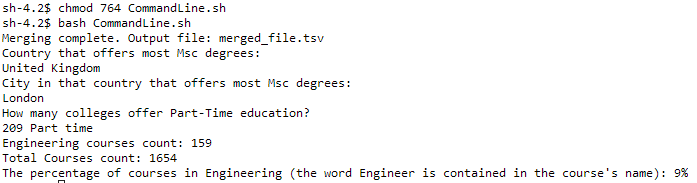